In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import os

In [2]:
dir = "C:/Users\maczek\Desktop/MP00BI00/MP00BI00/raw-exp"
dir = "C:/Users\maczek\Desktop/MP00BI00/MP00BI00/raw-linear"

In [3]:
f_list = os.listdir(dir)

In [4]:
df = pd.DataFrame()
for scen_name in f_list[:2]:
    # if "BIO00" in scen_name:
    #     continue
    # if "BIO45" in scen_name:
    #     continue
    # if "BIO15" in scen_name:
    #     continue
    # if "BIO25" in scen_name:
    #     continue
    # if "GHG400raw" in scen_name:
    #     df_tmp = pd.read_csv(dir+"/"+scen_name, sep=";")
    #     df_tmp = df_tmp[df_tmp["Region"]=="World"]
    #     df = pd.concat([df, df_tmp])
    #     del df_tmp
    # if "GHG600raw" in scen_name:
    df_tmp = pd.read_csv(dir+"/"+scen_name, sep=";")
    #df_tmp = df_tmp[df_tmp["Region"]=="World"]
    df = pd.concat([df, df_tmp])
    del df_tmp
    #if "BIO00" in scen_name:
    #    df_tmp = pd.read_csv(dir+"/"+scen_name, sep=";")
    #    df_tmp = df_tmp[df_tmp["Region"]=="World"]
    #    df = pd.concat([df, df_tmp])
    #    del df_tmp

In [5]:
df = df.reset_index(drop=True)
split_cols = df.reset_index()["Scenario"].str.split("GHG", expand=True)#.drop("Scenario", axis=1)
split_cols[0] = split_cols[0].str.replace("SSP2", "")
split_cols[1] = "GHG" + split_cols[1]
df[["BIO", "GHG"]] = split_cols

In [6]:
df = df.drop(["Unnamed: 23", "Scenario", "Model"], axis=1)
df = df.set_index(["Variable", "Region", "BIO", "GHG", "Unit"])
df.columns = [int(i) for i in df.columns]

In [7]:
df = df.melt(ignore_index=False)

In [24]:
from bokeh.models import CDSView, ColumnDataSource, IndexFilter

source = ColumnDataSource(df.loc["Biodiversity|BII"])

In [26]:
source.data

{'Region_BIO_GHG_Unit': array([('AFR', 'BIO00', 'GHG000', 'unitless'),
        ('CHA', 'BIO00', 'GHG000', 'unitless'),
        ('CPA', 'BIO00', 'GHG000', 'unitless'),
        ('EEU', 'BIO00', 'GHG000', 'unitless'),
        ('FSU', 'BIO00', 'GHG000', 'unitless'),
        ('LAM', 'BIO00', 'GHG000', 'unitless'),
        ('MEA', 'BIO00', 'GHG000', 'unitless'),
        ('NAM', 'BIO00', 'GHG000', 'unitless'),
        ('PAO', 'BIO00', 'GHG000', 'unitless'),
        ('PAS', 'BIO00', 'GHG000', 'unitless'),
        ('SAS', 'BIO00', 'GHG000', 'unitless'),
        ('WEU', 'BIO00', 'GHG000', 'unitless'),
        ('World', 'BIO00', 'GHG000', 'unitless'),
        ('AFR', 'BIO00', 'GHG010', 'unitless'),
        ('CHA', 'BIO00', 'GHG010', 'unitless'),
        ('CPA', 'BIO00', 'GHG010', 'unitless'),
        ('EEU', 'BIO00', 'GHG010', 'unitless'),
        ('FSU', 'BIO00', 'GHG010', 'unitless'),
        ('LAM', 'BIO00', 'GHG010', 'unitless'),
        ('MEA', 'BIO00', 'GHG010', 'unitless'),
        ('NAM',

In [20]:
source.data.get(["BIO", "GHG"])

TypeError: unhashable type: 'list'

In [28]:
"Region_BIO_GHG_Unit"
bools = [True if ((y_val[1] == "BIO00") & (y_val[2] == "GHG010")) else False for y_val in source.data["Region_BIO_GHG_Unit"]]
bools

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 

In [22]:
from bokeh.models import BooleanFilter

bools = [True if ((y_val[0] == "BIO00") & (y_val[1] == "GHG010")) else False for y_val in zip(source.data['BIO'], source.data['GHG'])]
view = CDSView(filter=BooleanFilter(bools))

#p2.circle(x="x", y="y", size=10, hover_color="red", source=source, view=view)
bools

[False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 

In [66]:
import math
regs = 15
rows = math.ceil(math.sqrt(regs))
if (rows * (rows-1)) >= (regs):
    cols = rows - 1
else:
    cols = rows
cols

4

In [10]:
df = df.set_index(["Model", "Scenario", "Region", "Variable", "Unit"])
df = df.drop(df.columns[-1], axis=1)
df.columns = [int(i) for i in df.columns]

ValueError: invalid literal for int() with base 10: 'Unnamed: 23'

In [44]:
df

variable     value
Variable         Region BIO   GHG    Unit                        
Biodiversity|BII AFR    BIO00 GHG000 unitless      1995  0.753832
                 CHA    BIO00 GHG000 unitless      1995  0.750001
                 CPA    BIO00 GHG000 unitless      1995  0.832715
                 EEU    BIO00 GHG000 unitless      1995  0.673826
                 FSU    BIO00 GHG000 unitless      1995  0.849367
...                                                 ...       ...
ZERO             PAO    BIO00 GHG010 NaN           2100  0.000000
                 PAS    BIO00 GHG010 NaN           2100  0.000000
                 SAS    BIO00 GHG010 NaN           2100  0.000000
                 WEU    BIO00 GHG010 NaN           2100  0.000000
                 World  BIO00 GHG010 NaN           2100  0.000000

[593892 rows x 2 columns]

In [27]:
afolu_co2 = "Emissions|CO2|Land|+|Land-use Change"
for_cov = "Resources|Land Cover|+|Forest"
cro_cov = "Resources|Land Cover|+|Cropland"
#afolu_co2 = "Emissions|CO2|Land"
luc_co2 = "Emissions|CO2|Land|Cumulative|Land-use Change|+|Gross LUC"
luc_co2 = "Emissions|CO2|Land|Land-use Change|+|Gross LUC"
luc_co2_def = "Emissions|CO2|Land|Land-use Change|+|Gross LUC"
luc_co2_all = "Emissions|CO2|Land|Land-use Change|Gross LUC"

In [75]:
set([i for i in df.index.get_level_values(3) if "Regr" in i])

{'Emissions|CO2|Land|Cumulative|Land-use Change|+|Regrowth',
 'Emissions|CO2|Land|Cumulative|Land-use Change|Regrowth|CO2-price AR',
 'Emissions|CO2|Land|Cumulative|Land-use Change|Regrowth|NPI_NDC AR',
 'Emissions|CO2|Land|Cumulative|Land-use Change|Regrowth|Other Land',
 'Emissions|CO2|Land|Cumulative|Land-use Change|Regrowth|Secondary Forest',
 'Emissions|CO2|Land|Cumulative|Land-use Change|Regrowth|Timber Plantations',
 'Emissions|CO2|Land|Land-use Change|+|Regrowth',
 'Emissions|CO2|Land|Land-use Change|Regrowth|CO2-price AR',
 'Emissions|CO2|Land|Land-use Change|Regrowth|NPI_NDC AR',
 'Emissions|CO2|Land|Land-use Change|Regrowth|Other Land',
 'Emissions|CO2|Land|Land-use Change|Regrowth|Secondary Forest',
 'Emissions|CO2|Land|Land-use Change|Regrowth|Timber Plantations'}

In [63]:
from matplotlib.backends.backend_pdf import PdfPages

In [69]:
import time

187.0278775691986
373.2970609664917


C:\Users\maczek\AppData\Local\Temp\ipykernel_28236\1713529792.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(4, 3, figsize=(25,18))


560.124425649643
749.7232000827789


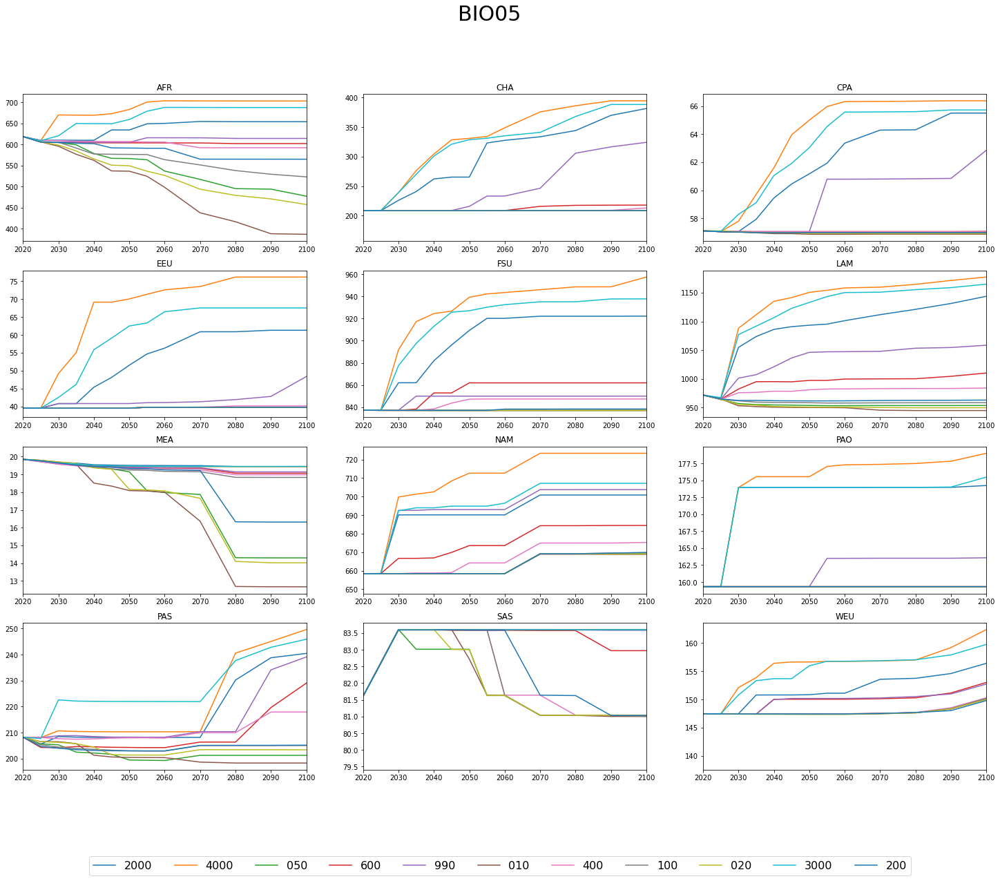

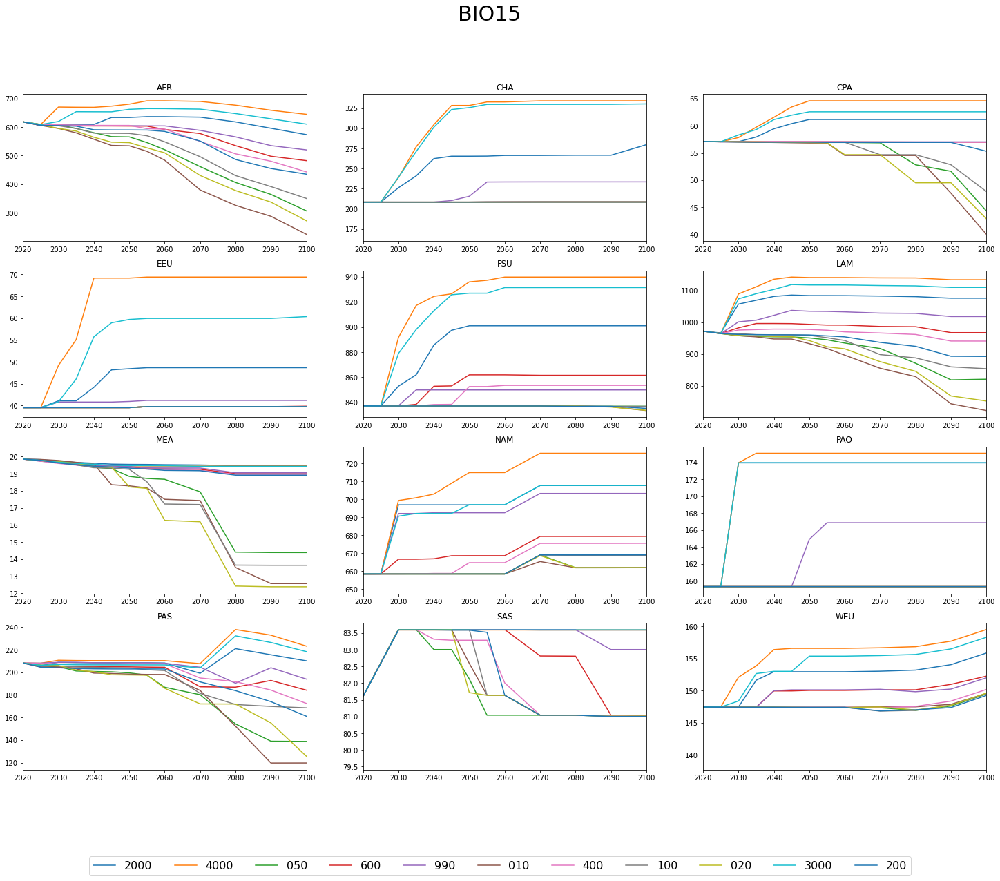

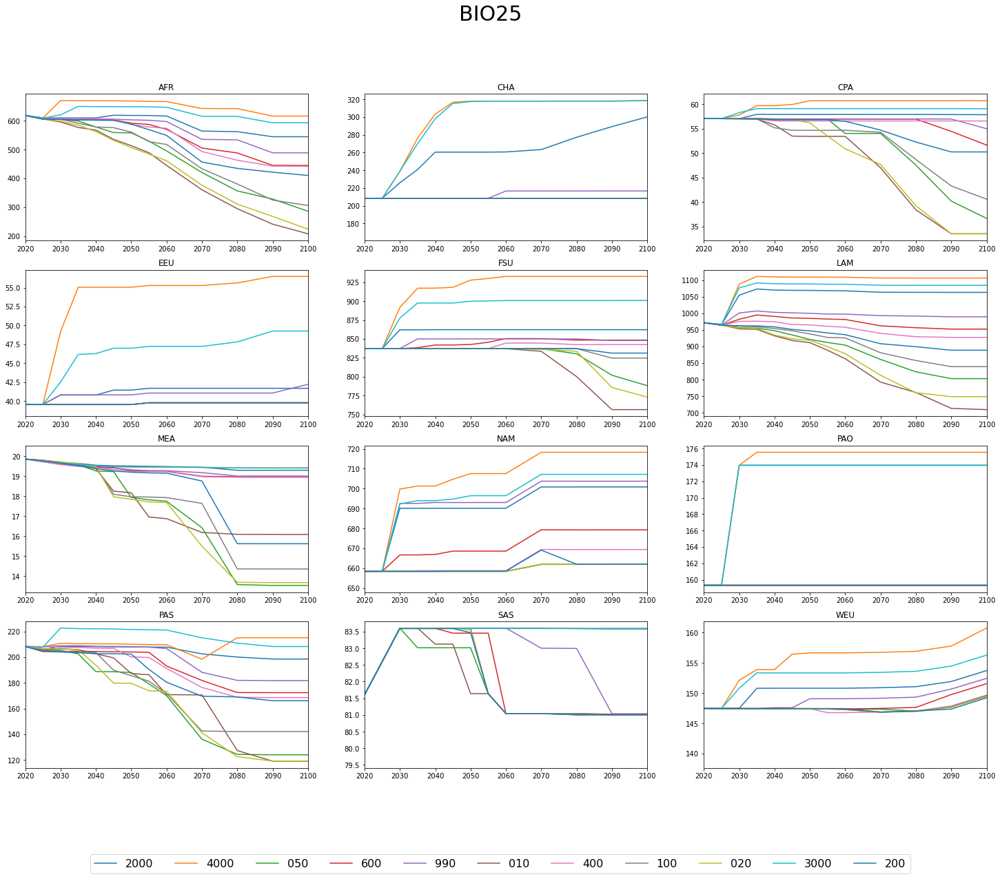

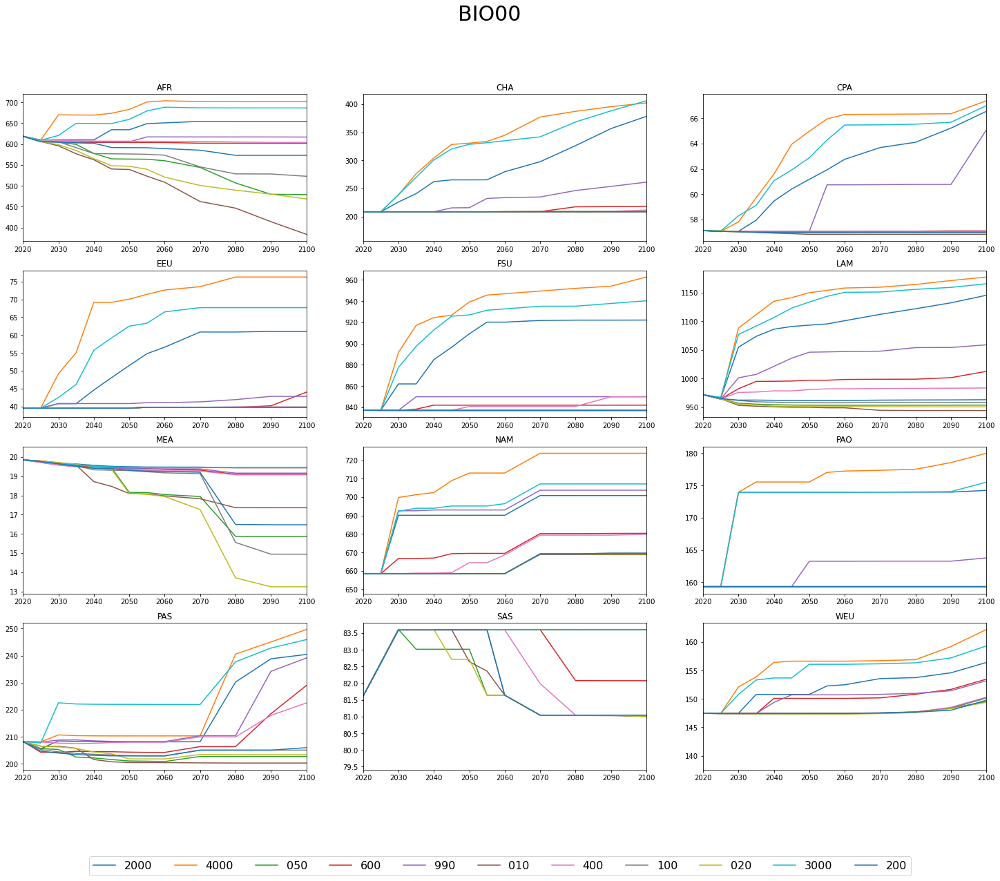

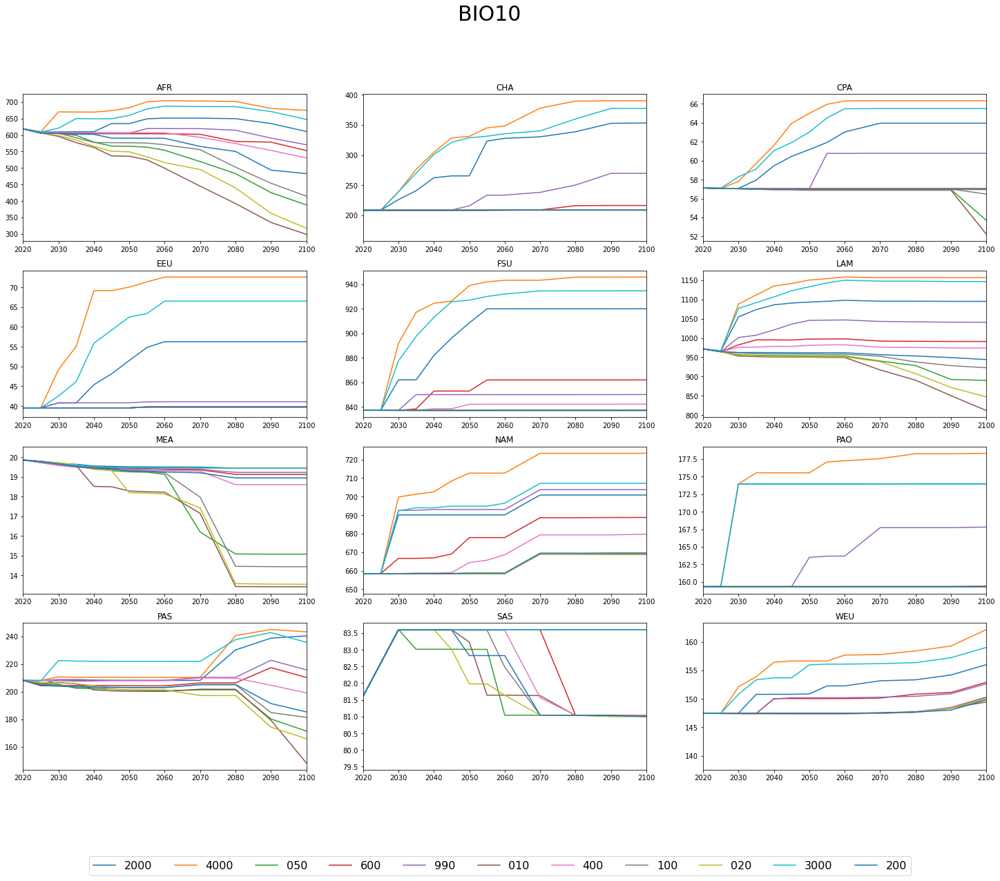

...

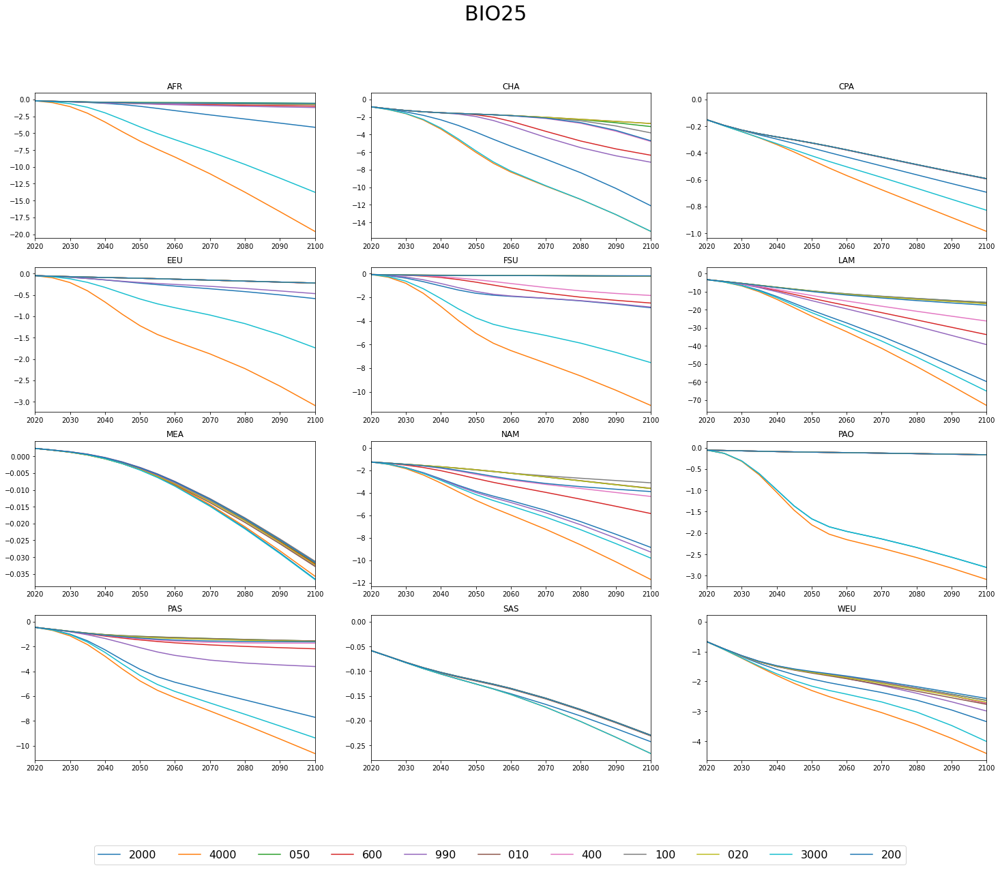

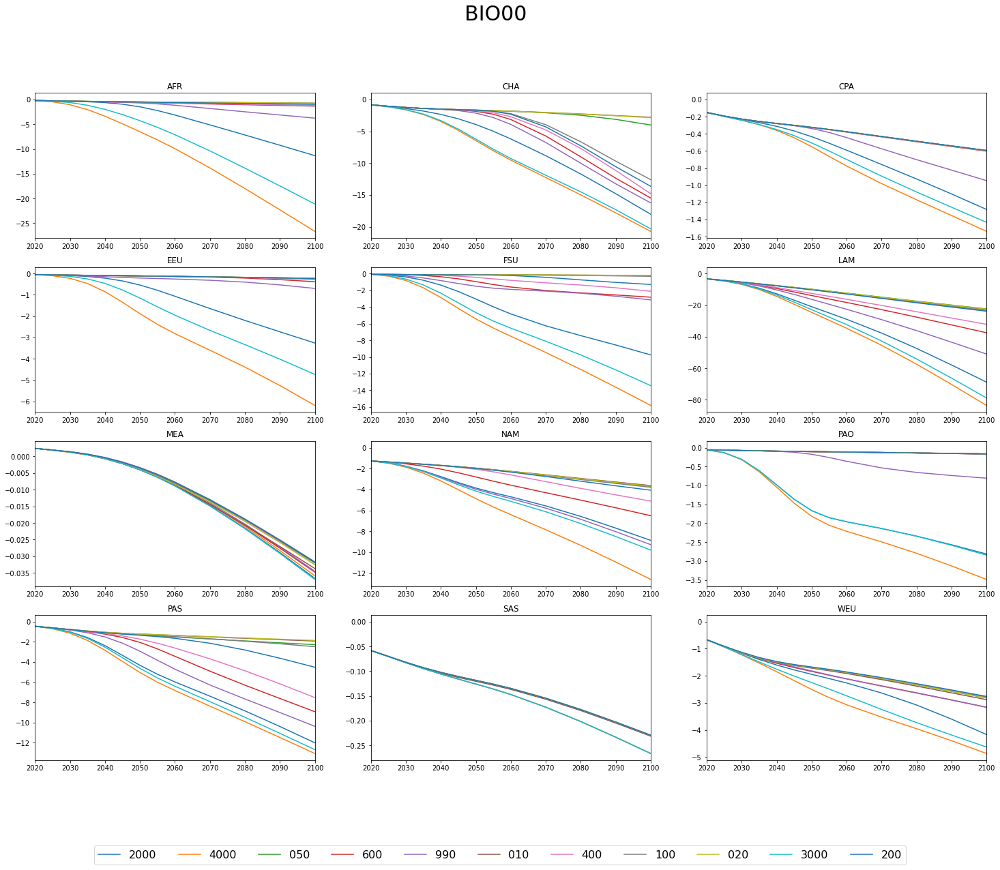

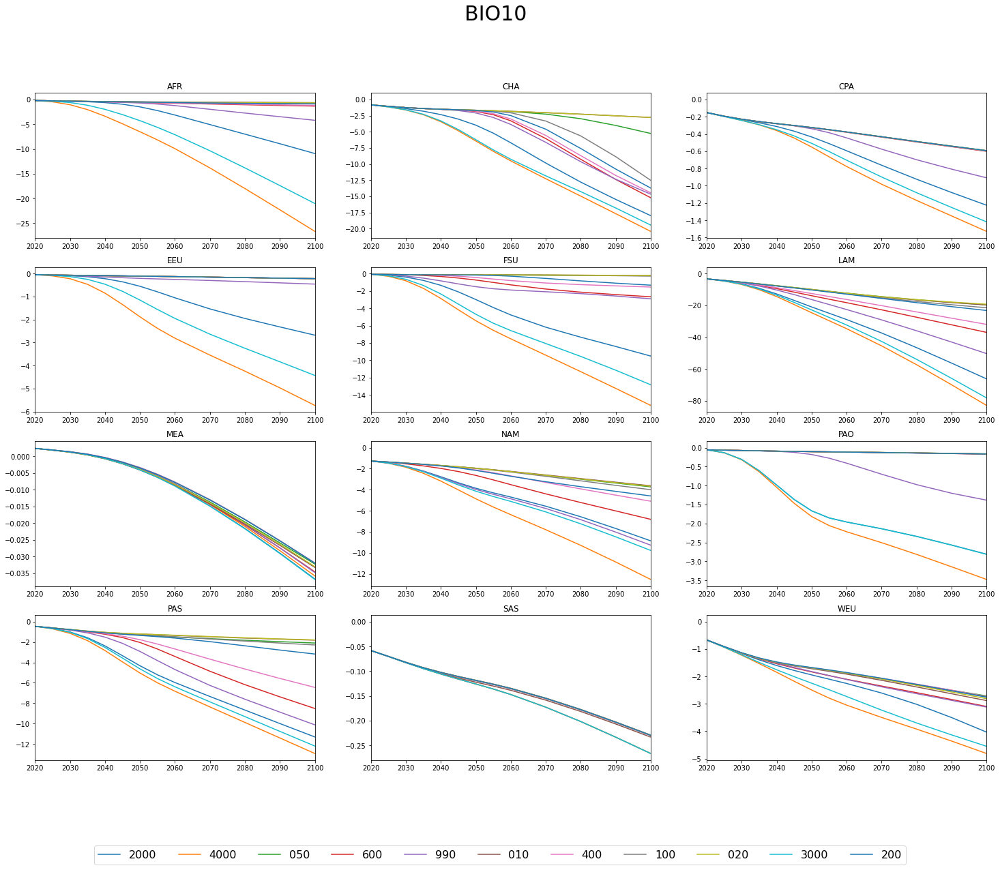

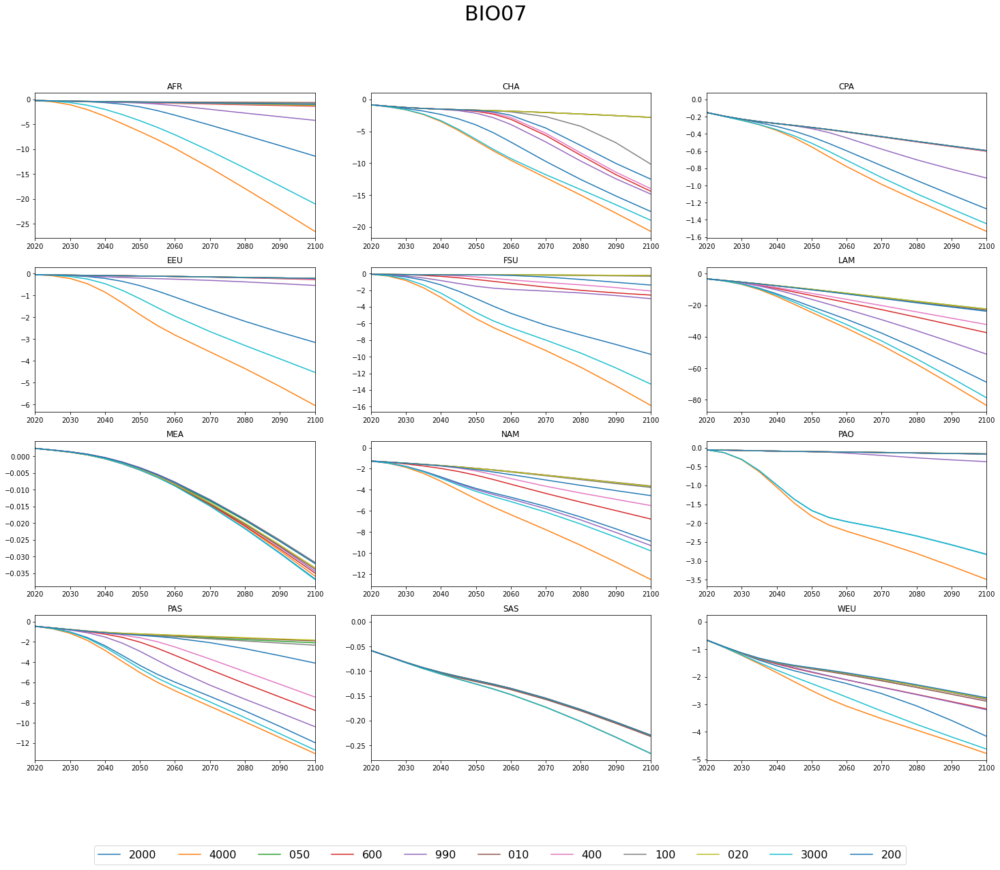

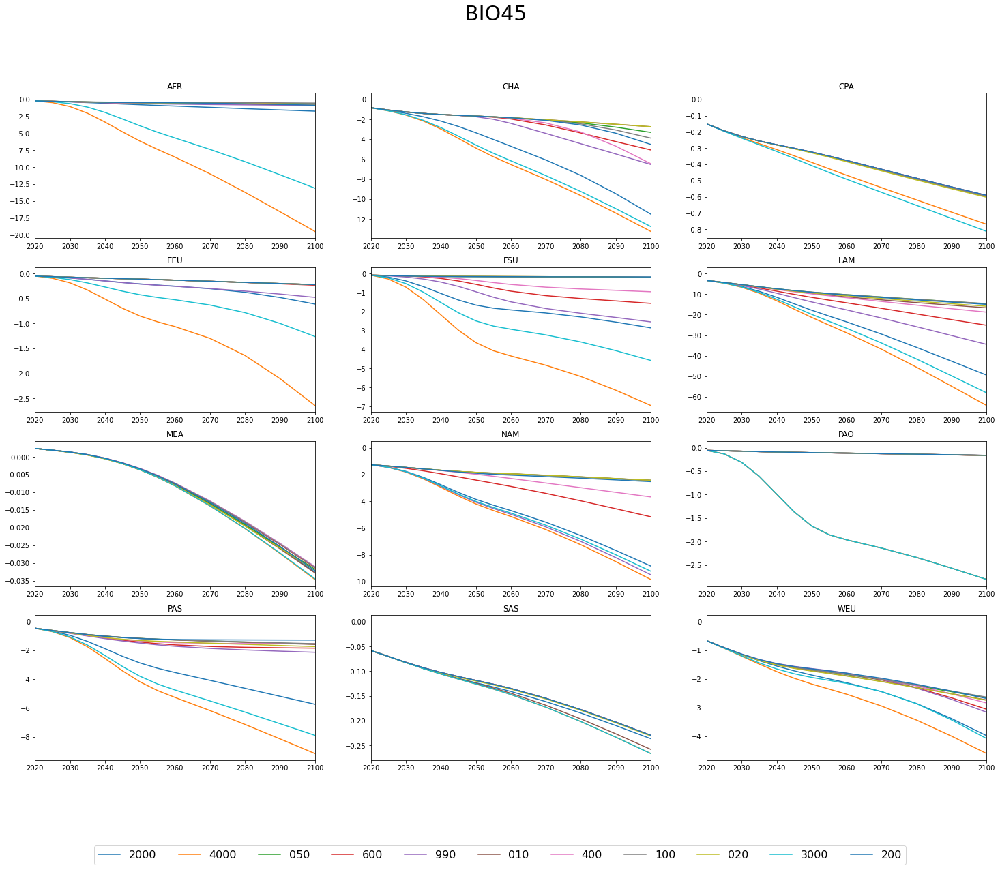

In [82]:
start = time.time()

vars = ["Resources|Land Cover|+|Forest",
        "Resources|Land Cover|+|Cropland",
        "Emissions|CO2|Land|+|Land-use Change",
        "Emissions|CO2|Land|Cumulative|Land-use Change|+|Regrowth"]
for var in vars:
    df_var = df[df.index.get_level_values(3)==(var)].melt(ignore_index=False)
    with PdfPages(f'{var.split("|")[-1]}.pdf') as pdf:
        for bio in set([i[0] for i in df.index.get_level_values(1).str.split("G")]):
            #print(bio)
            df_var_bio = df_var[df_var.index.get_level_values(1).str.startswith(bio)]
            fig, axs = plt.subplots(4, 3, figsize=(25,18))
            ax_it = iter(fig.axes)
            for reg in df_var_bio.index.get_level_values(2).unique():
                if reg == "World":
                    continue
                legend = []
                ax = next(ax_it)
                df_reg = df_var_bio[df_var_bio.index.get_level_values(2)==reg]
                for ghg in set([i[2] for i in df.index.get_level_values(1).str.split("G")]):
                    #print(df_reg[df_reg.index.get_level_values(1).str.endswith(ghg)])
                    if ghg == "000":
                        continue
                    df_reg[df_reg.index.get_level_values(1).str.endswith(ghg)].plot(x="variable", y="value", ax=ax, legend=False)
                    legend.append(ghg)
                #ax.legend(legend)
                ax.set_xlabel("")
                ax.set_title(reg)
                ax.set_xlim((2020,2100))
                #ax.set_ylim((3000,5000))
    
            fig.suptitle(bio.replace("SSP2",""), fontsize=30)
            fig.legend(legend, loc="lower center", fontsize=16, ncol=12)
            #fig.savefig(f"example_{bio}.svg")
            pdf.savefig()
            
    end = time.time()
    print(end - start)

(2020.0, 2100.0)

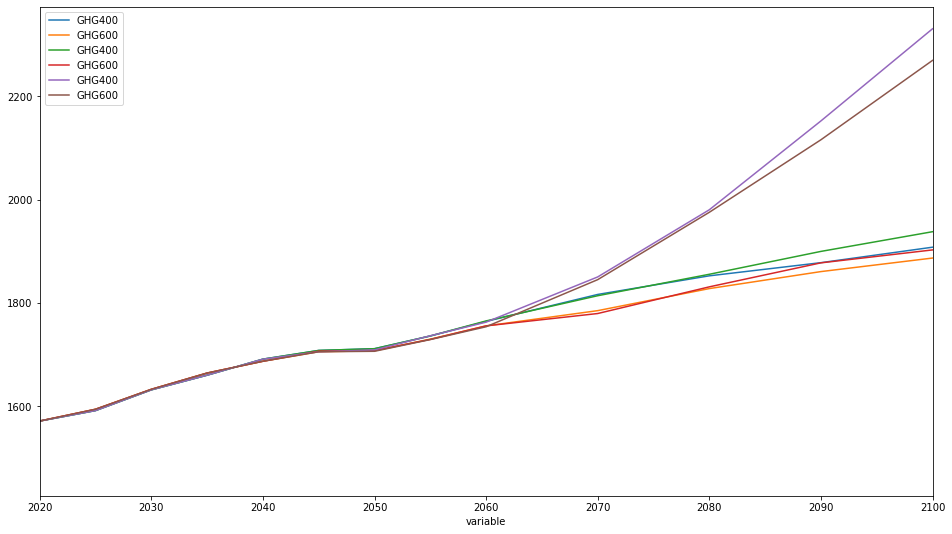

In [241]:
var = cro_cov

fig, ax = plt.subplots(figsize=(16,9))
df_var = df[df.index.get_level_values(3)==(var)].melt(ignore_index=False)
legend = []
for reg in df_var.index.get_level_values(1).unique():
    df_reg = df_var[df_var.index.get_level_values(1)==reg]
    df_reg.plot(x = "variable", y="value", ax = ax)
    legend.append(reg[-6:])

ax.legend(legend)
ax.set_xlim((2020,2100))

(2020.0, 2100.0)

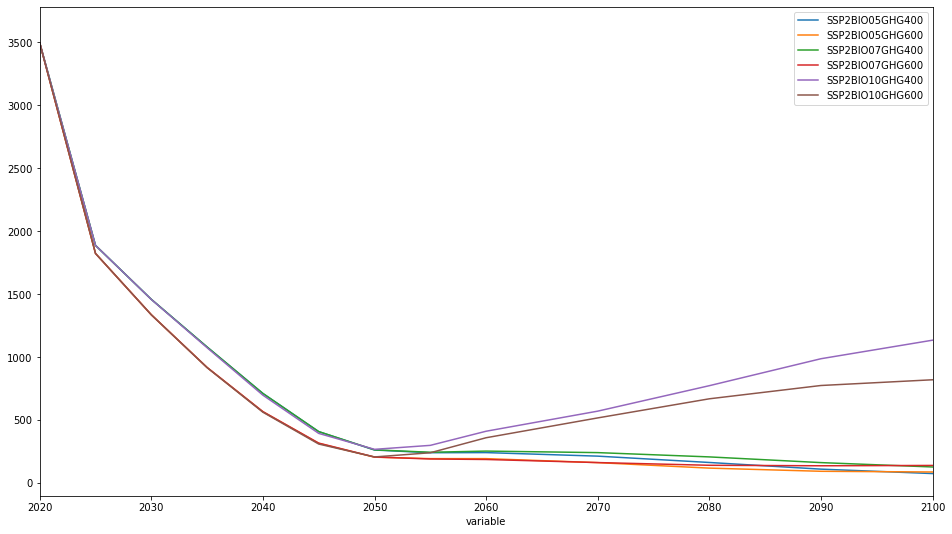

In [240]:
var = luc_co2

fig, ax = plt.subplots(figsize=(16,9))
df_var = df[df.index.get_level_values(3)==(var)].melt(ignore_index=False)
legend = []
for reg in df_var.index.get_level_values(1).unique():
    df_reg = df_var[df_var.index.get_level_values(1)==reg]
    df_reg.plot(x = "variable", y="value", ax = ax)
    legend.append(reg)#[-6:])

ax.legend(legend)
ax.set_xlim((2020,2100))

In [368]:
import pyam

In [369]:
py_df = pyam.IamDataFrame(df)
#df_lands = df[df.index.get_level_values(3).str.startswith("Resources|Land Cover|+|")]
#df_lands_tot = df[df.index.get_level_values(3)==("Resources|Land Cover")]

In [286]:
for i in py_df.filter(variable="Resources|Land Cover|+|*").variable:
    print(i)
    py_df.divide(i, "Resources|Land Cover", f"Share|{i}", append=True)

Resources|Land Cover|+|Cropland
Resources|Land Cover|+|Forest
Resources|Land Cover|+|Other Land
Resources|Land Cover|+|Pastures and Rangelands
Resources|Land Cover|+|Urban Area


<AxesSubplot:title={'center':'model: MAgPIEMP00BD1BI00 - scenario: SSP2BIO10GHG400 - region: World'}, xlabel='Year', ylabel='Value'>

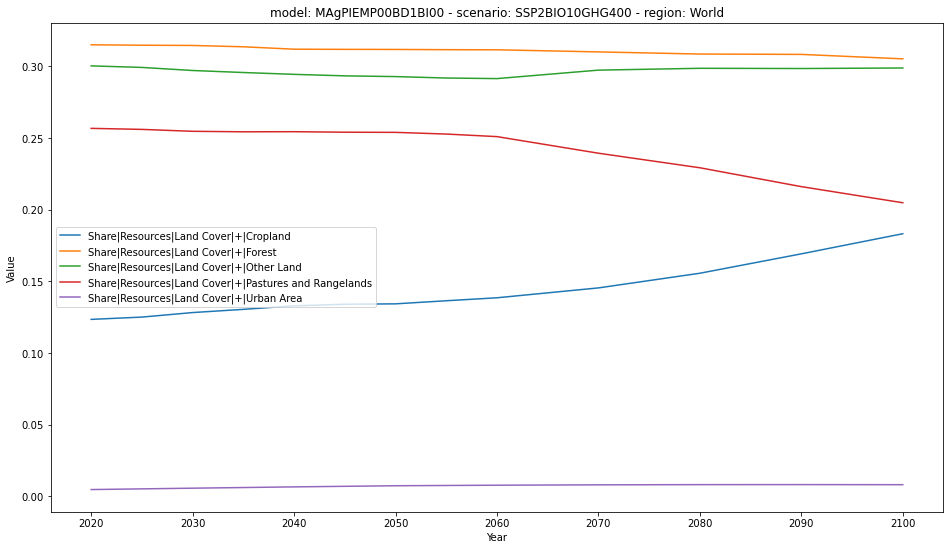

In [309]:
fig,ax = plt.subplots(figsize=(16,9))
py_df.filter(variable="Share|Resources|Land Cover|+|*", year=[i for i in range(2020,2110,5)], scenario="SSP2BIO10GHG400").plot(ax=ax)

<AxesSubplot:title={'center':'model: MAgPIEMP00BD1BI00 - scenario: SSP2BIO10GHG400 - region: World - variable: Emissions|CO2|Land|Land-use Change|Gross LUC|+|Deforestation'}, xlabel='Year', ylabel='Mt CO2/yr'>

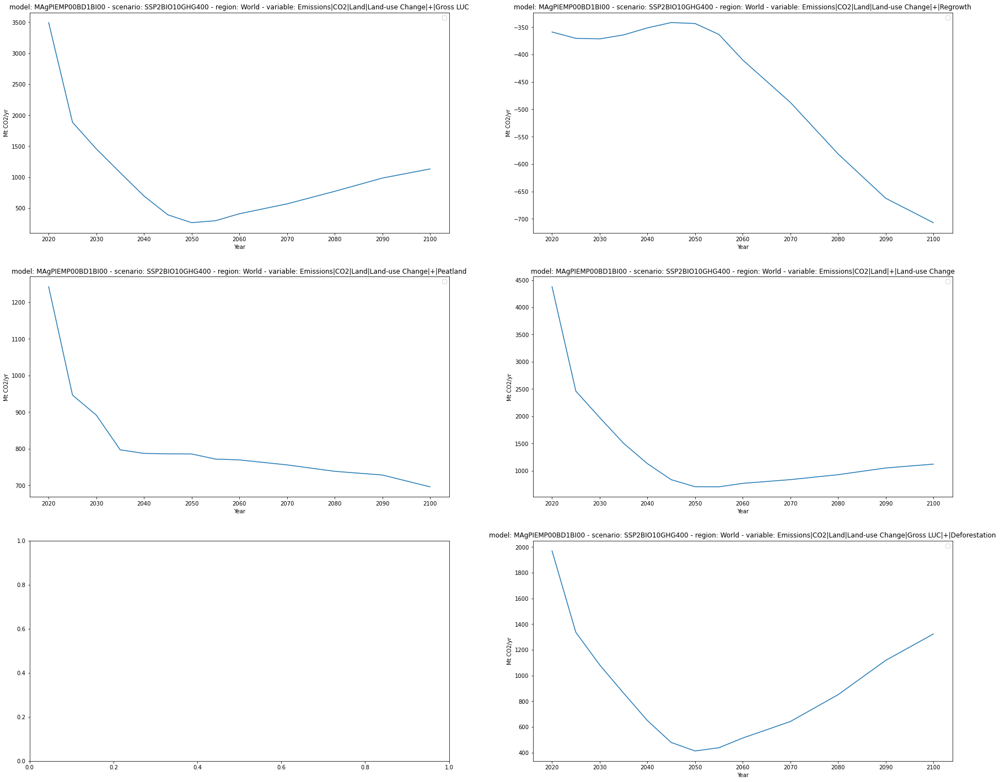

In [313]:
fig, ax = plt.subplots(3,2, figsize=(30,25))

py_df.filter(variable=luc_co2+"*", year=[i for i in range(2020,2110,5)], scenario="SSP2BIO10GHG400").plot(ax=ax[0][0])
py_df.filter(variable=afolu_co2, year=[i for i in range(2020,2110,5)], scenario="SSP2BIO10GHG400").plot(ax=ax[1][1])
py_df.filter(variable="Emissions|CO2|Land|Land-use Change|+|Regrowth",
             year=[i for i in range(2020,2110,5)], scenario="SSP2BIO10GHG400").plot(ax=ax[0][1])
py_df.filter(variable="Emissions|CO2|Land|Land-use Change|+|Peatland",
             year=[i for i in range(2020,2110,5)], scenario="SSP2BIO10GHG400").plot(ax=ax[1][0])
py_df.filter(variable="Emissions|CO2|Land|Land-use Change|Gross LUC|+|Deforestation",
             year=[i for i in range(2020,2110,5)], scenario="SSP2BIO10GHG400").plot(ax=ax[2][1])

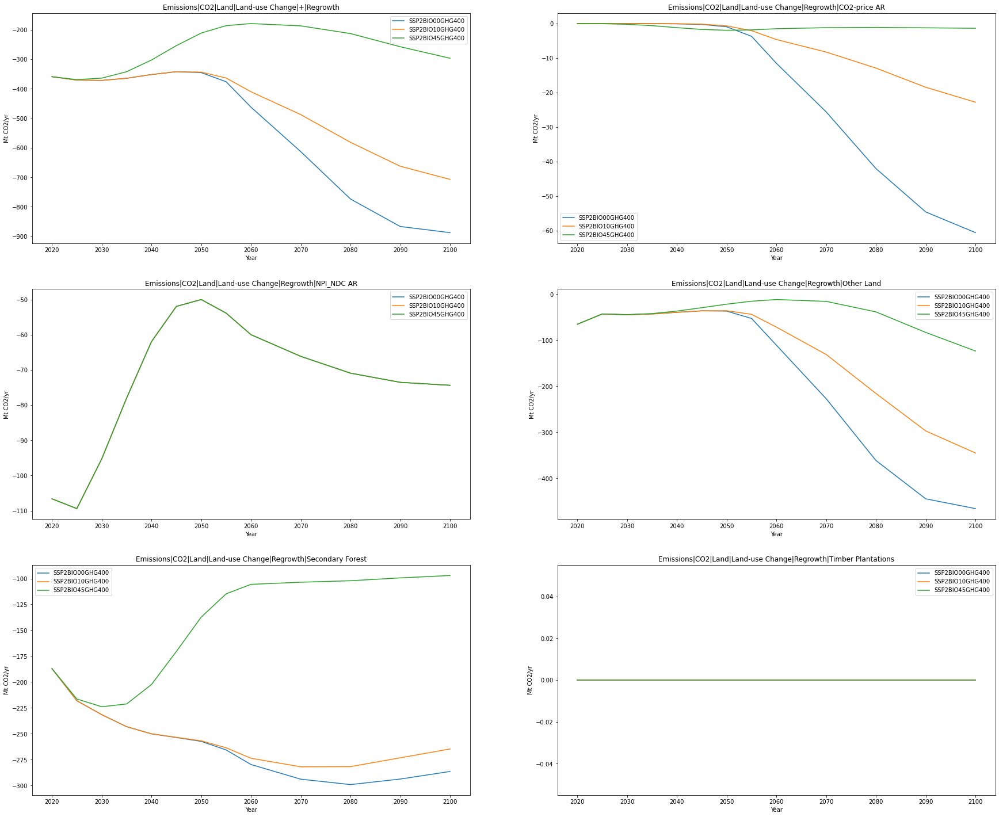

In [378]:
fig, ax = plt.subplots(3,2, figsize=(30,25))
vars = ["Emissions|CO2|Land|Land-use Change|+|Regrowth",
"Emissions|CO2|Land|Land-use Change|Regrowth|CO2-price AR",
"Emissions|CO2|Land|Land-use Change|Regrowth|NPI_NDC AR",
"Emissions|CO2|Land|Land-use Change|Regrowth|Other Land",
"Emissions|CO2|Land|Land-use Change|Regrowth|Secondary Forest",
"Emissions|CO2|Land|Land-use Change|Regrowth|Timber Plantations"]
ax_it = iter(fig.axes)
for var in vars:
    ax = next(ax_it)
    py_df.filter(variable=var,
             year=[i for i in range(2020,2110,5)], 
                 scenario=["SSP2BIO10GHG400", "SSP2BIO00GHG400", "SSP2BIO45GHG400"]).plot(ax=ax)
    ax.set_title(var)

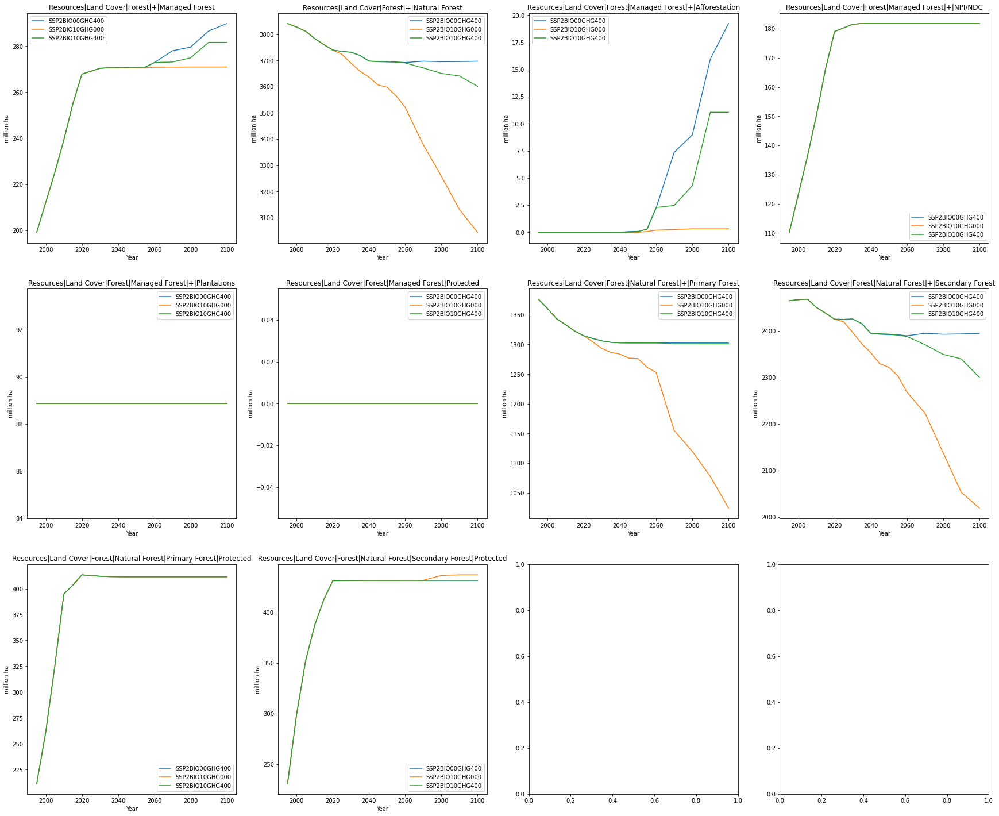

In [384]:

fig, ax = plt.subplots(3,4, figsize=(30,25))

ax_it = iter(fig.axes)
for var in df[df.index.get_level_values(3).str.startswith("Resources|Land Cover|For")].index.get_level_values(3).unique():
    ax = next(ax_it)
    py_df.filter(variable=var,
             year=[i for i in range(1995,2110,5)], 
                 scenario=["SSP2BIO10GHG400", "SSP2BIO00GHG400", "SSP2BIO10GHG000"]).plot(ax=ax) ##.diff({var:"test"})
    ax.set_title(var)

Emissions|CO2|Land|Land-use Change|Gross LUC|+|Deforestation
Emissions|CO2|Land|Land-use Change|Gross LUC|+|Forest Degradation
Emissions|CO2|Land|Land-use Change|Gross LUC|+|Other land conversion


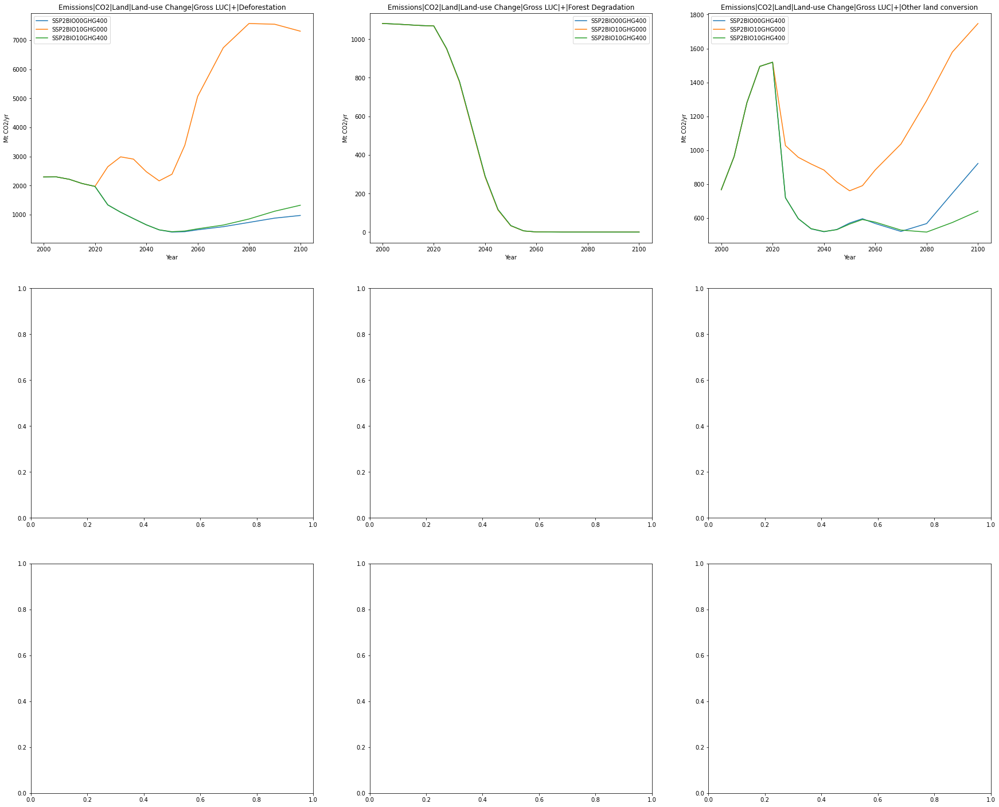

In [381]:

fig, ax = plt.subplots(3,3, figsize=(30,25))

ax_it = iter(fig.axes)
for var in df[df.index.get_level_values(3).str.startswith("Emissions|CO2|Land|Land-use Change|Gross LUC")].index.get_level_values(3).unique():
    ax = next(ax_it)
    py_df.filter(variable=var,
             #year=[i for i in range(2020,2110,5)], 
                 scenario=["SSP2BIO10GHG400", "SSP2BIO00GHG400", "SSP2BIO10GHG000"]).plot(ax=ax) ##.diff({var:"test"})
    print(var)
    ax.set_title(var)

<AxesSubplot:title={'center':'model: MAgPIEMP00BD1BI00 - scenario: SSP2BIO10GHG400 - region: World - variable: Resources|Land Cover|Forest|+|Natural Forest'}, xlabel='Year', ylabel='million ha'>

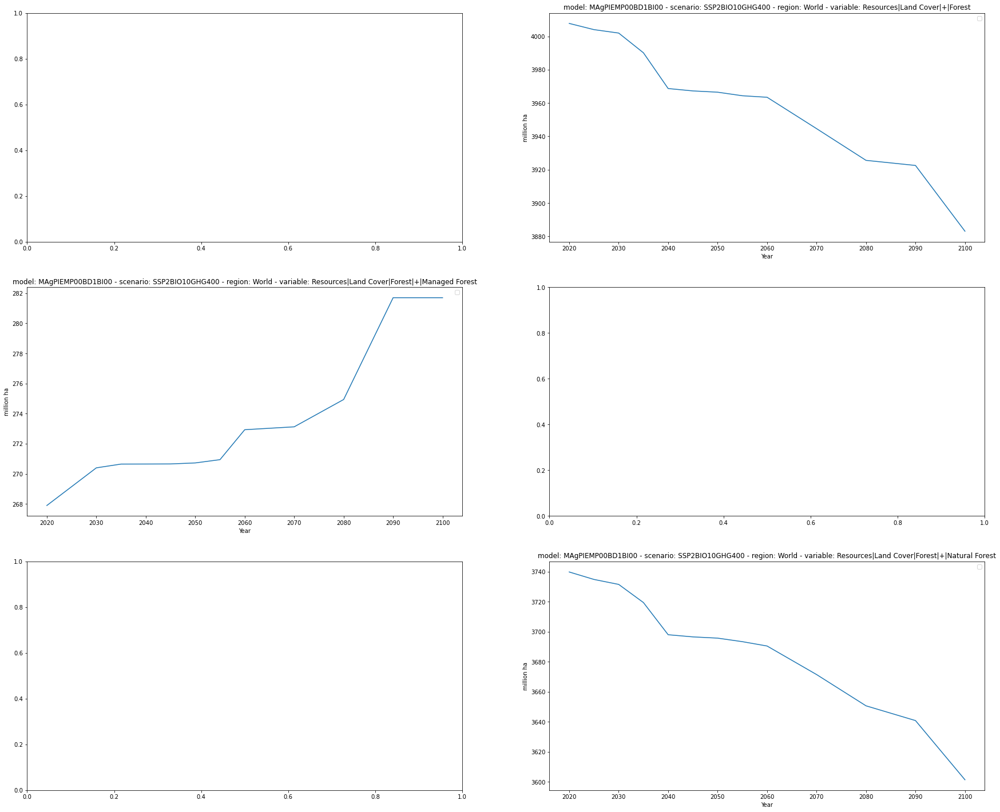

In [322]:
fig, ax = plt.subplots(3,2, figsize=(30,25))

py_df.filter(variable="Resources|Land Cover|+|Forest", year=[i for i in range(2020,2110,5)], scenario="SSP2BIO10GHG400").plot(ax=ax[0][1])
py_df.filter(variable="Resources|Land Cover|Forest|+|Managed Forest", year=[i for i in range(2020,2110,5)], scenario="SSP2BIO10GHG400").plot(ax=ax[1][0])
py_df.filter(variable="Resources|Land Cover|Forest|+|Natural Forest", year=[i for i in range(2020,2110,5)], scenario="SSP2BIO10GHG400").plot(ax=ax[2][1])

<AxesSubplot:title={'center':'model: MAgPIEMP00BD1BI00 - scenario: SSP2BIO10GHG400 - region: World - variable: test'}, xlabel='Year', ylabel='Mt CO2/yr'>

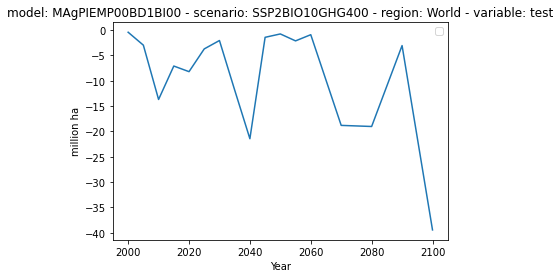

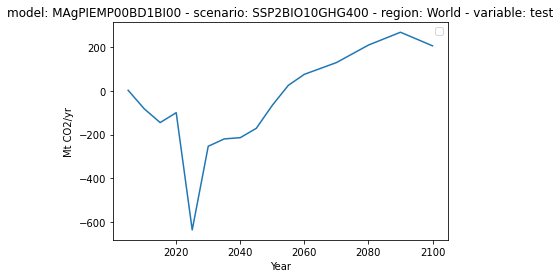

In [337]:
py_df.filter(variable="Resources|Land Cover|+|Forest", year=[i for i in range(2020,2110,5)], scenario="SSP2BIO10GHG400")
py_df.filter(variable="Resources|Land Cover|Forest|+|Managed Forest", year=[i for i in range(2020,2110,5)], scenario="SSP2BIO10GHG400")
py_df.filter(variable="Resources|Land Cover|+|Forest", 
             #year=[i for i in range(2020,2110,5)], 
             scenario="SSP2BIO10GHG400").diff({"Resources|Land Cover|+|Forest":"test"}).plot()
py_df.filter(variable="Emissions|CO2|Land|Land-use Change|Gross LUC|+|Deforestation",
             #year=[i for i in range(2020,2110,5)], 
             scenario="SSP2BIO10GHG400").diff({"Emissions|CO2|Land|Land-use Change|Gross LUC|+|Deforestation":"test"}).plot()

<AxesSubplot:title={'center':'model: MAgPIEMP00BD1BI00 - region: World - variable: Emissions|CO2|Land|Land-use Change|+|Regrowth'}, xlabel='Year', ylabel='Mt CO2/yr'>

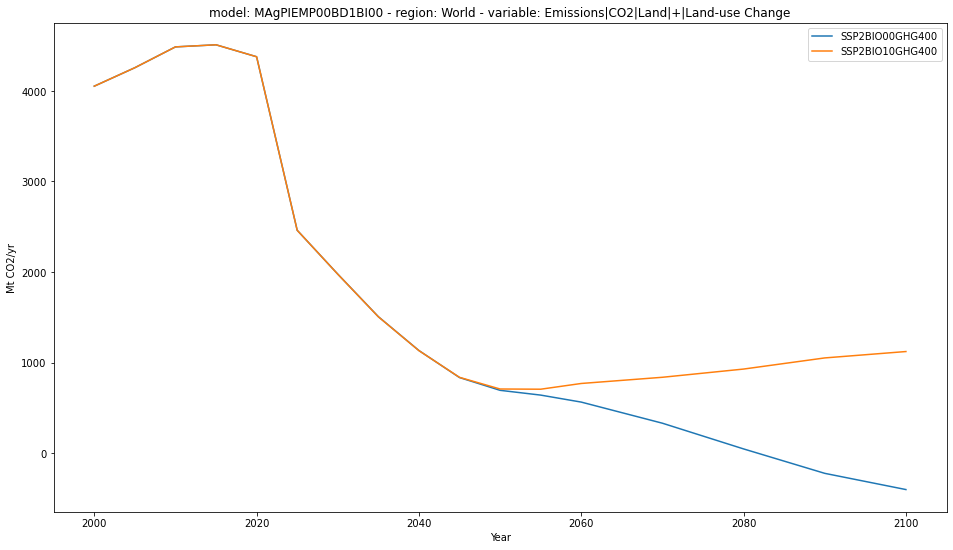

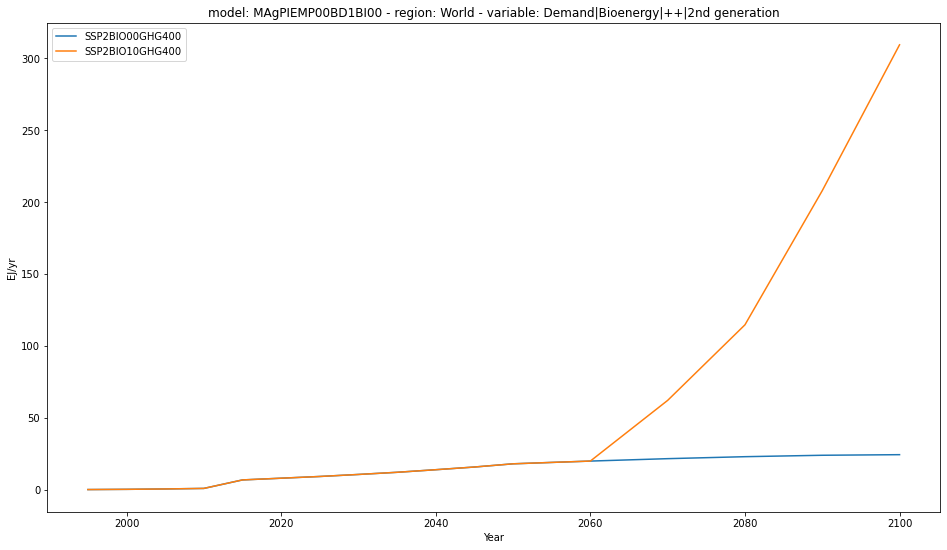

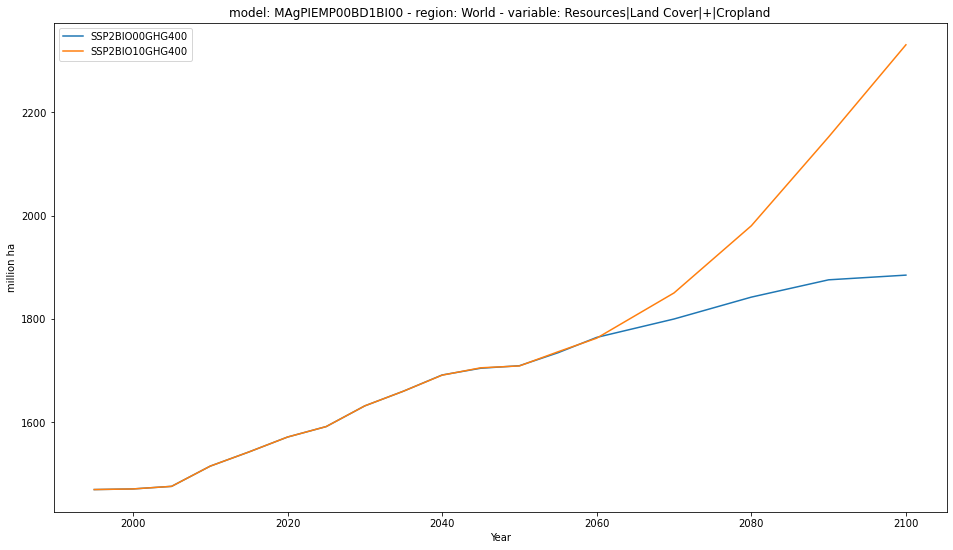

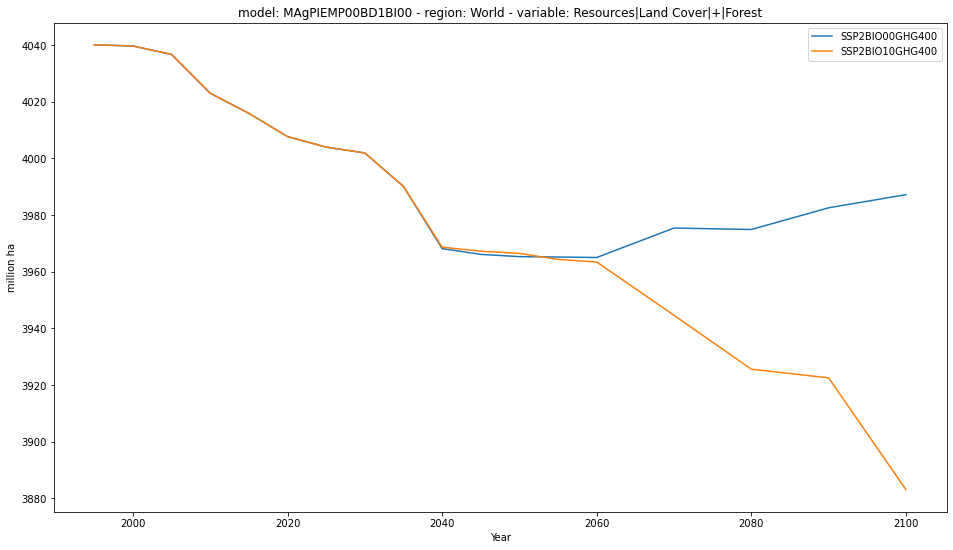

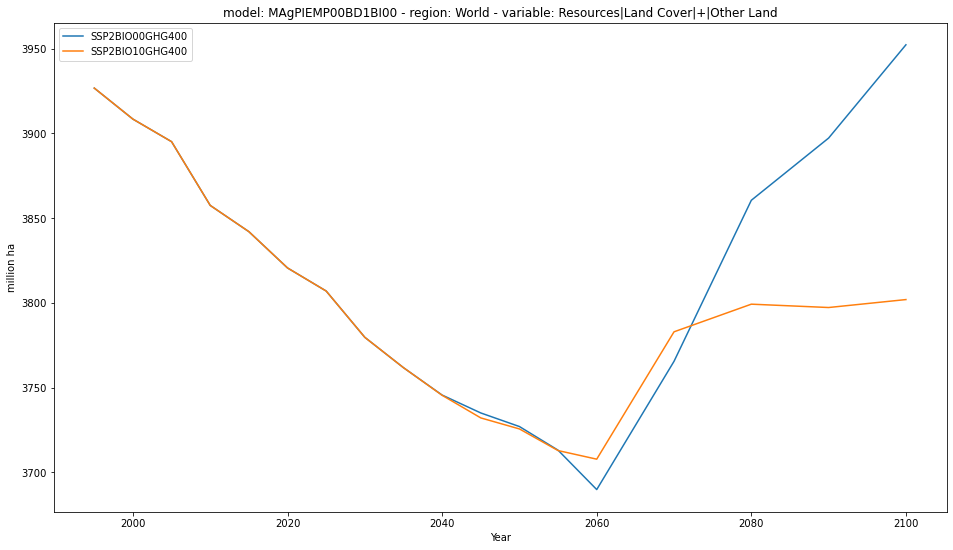

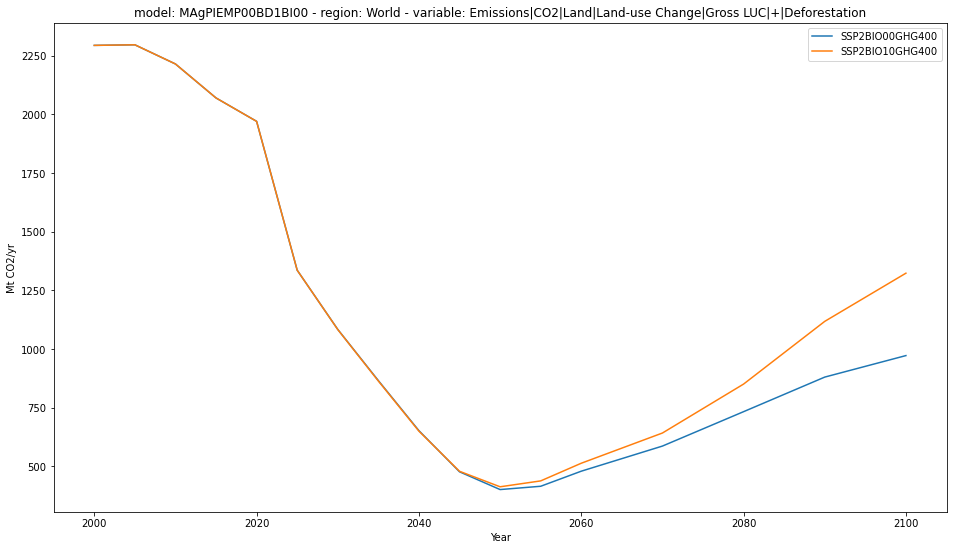

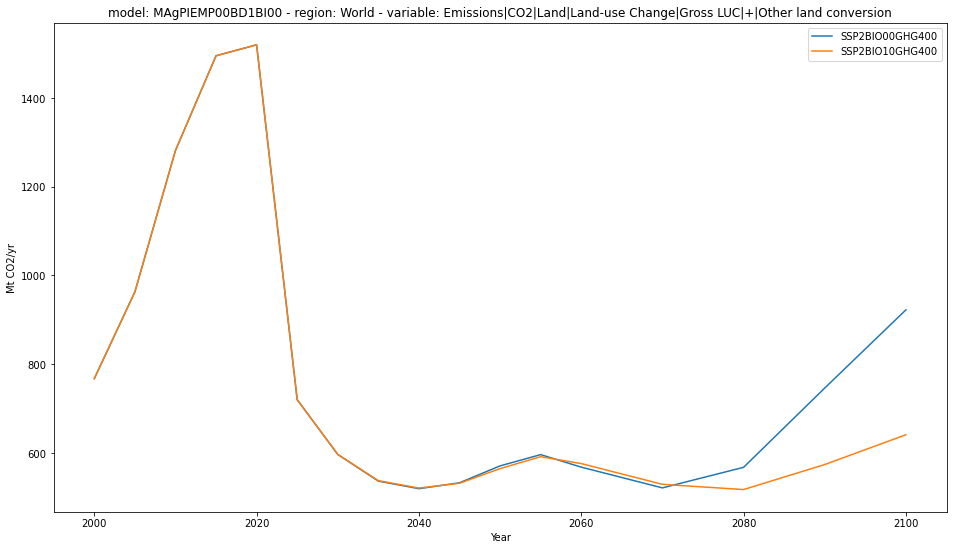

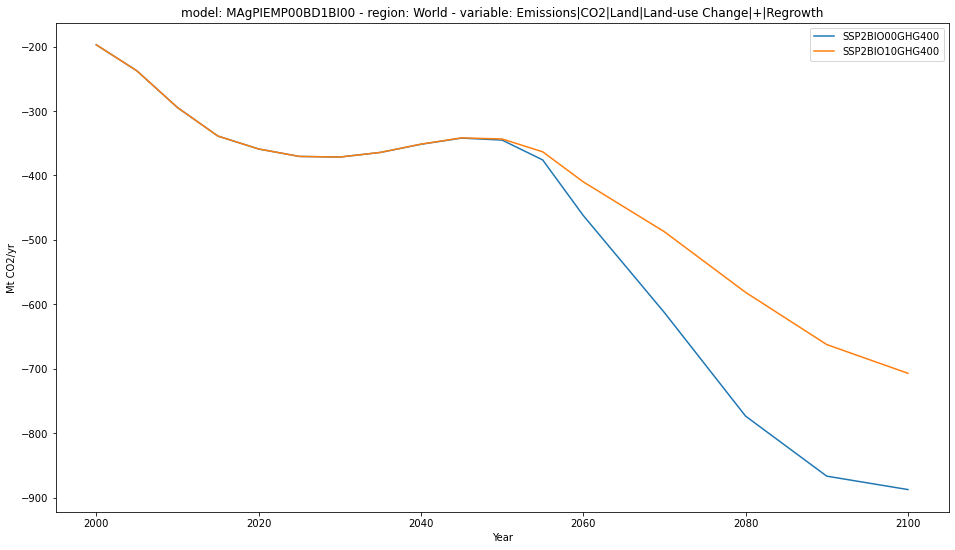

In [486]:
ghg1 = "400"
ghg2 = "400"
bio1 = "10"
bio2 = "00"
scen = [f"SSP2BIO{bio1}GHG{ghg1}", f"SSP2BIO{bio2}GHG{ghg1}", f"SSP2BIO{bio1}GHG{ghg2}", f"SSP2BIO{bio2}GHG{ghg2}"]
#fig, ax = plt.subplots(3,3, figsize=(30,20))
py_df.filter(variable="Emissions|CO2|Land|+|Land-use Change", scenario=scen).plot(figsize=(16,9))
for i in df[df.index.get_level_values(3).str.startswith("Demand|Bioenergy|++|2nd generation")].index.get_level_values(3).unique():
    py_df.filter(variable=i, scenario=scen).plot(figsize=(16,9))
for i in df[df.index.get_level_values(3).str.startswith("Resources|Land Cover|+")].index.get_level_values(3).unique()[:3]:
    py_df.filter(variable=i, scenario=scen).plot(figsize=(16,9))
py_df.filter(variable="Emissions|CO2|Land|Land-use Change|Gross LUC|+|Deforestation", scenario=scen).plot(figsize=(16,9))
py_df.filter(variable="Emissions|CO2|Land|Land-use Change|Gross LUC|+|Other land conversion", scenario=scen).plot(figsize=(16,9))
py_df.filter(variable="Emissions|CO2|Land|Land-use Change|+|Regrowth", scenario=scen).plot(figsize=(16,9))
#py_df.filter(variable="Productivity|Landuse Intensity Indicator Tau", scenario=scen).plot()
#py_df.filter(variable="Productivity|Landuse Intensity Indicator Tau", scenario=scen).diff({"Productivity|Landuse Intensity Indicator Tau":"test"}).plot()

['SSP2BIO45GHG100', 'SSP2BIO00GHG100', 'SSP2BIO45GHG4000', 'SSP2BIO00GHG4000']
['SSP2BIO45GHG100', 'SSP2BIO00GHG100', 'SSP2BIO45GHG4000', 'SSP2BIO00GHG4000']


pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend
pyam.plotting - INFO: >=13 labels, not applying legend


<AxesSubplot:title={'center':'model: MAgPIEMP00BD1BI00 - region: World - variable: test'}, xlabel='Year', ylabel='Index'>

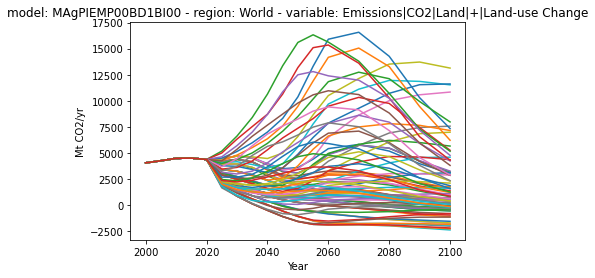

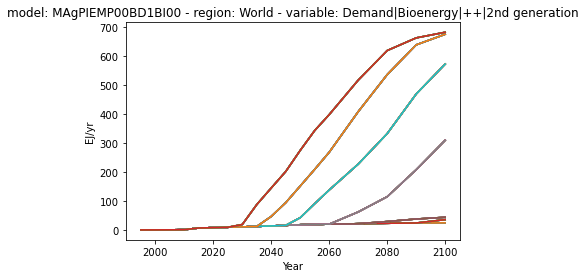

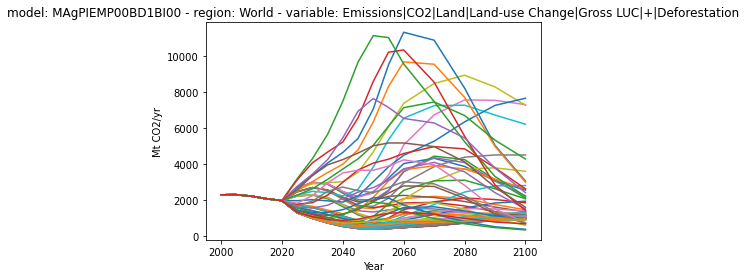

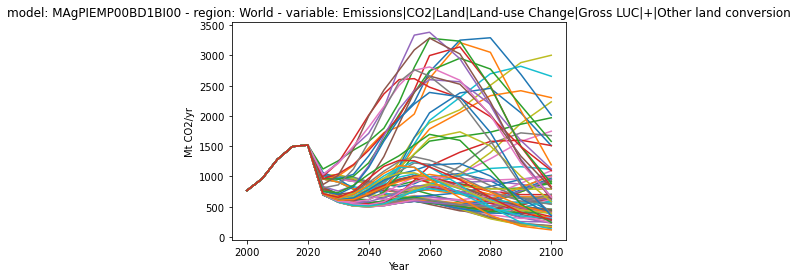

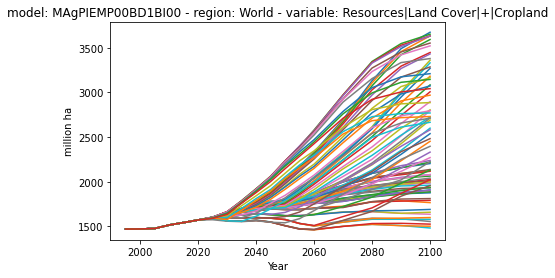

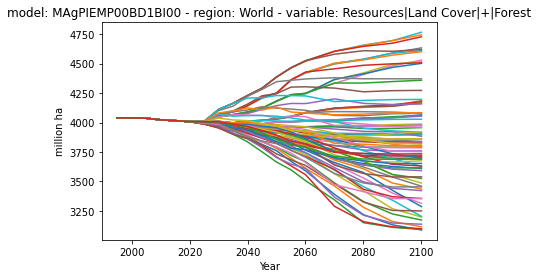

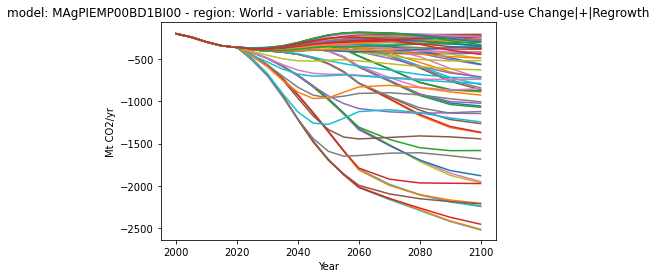

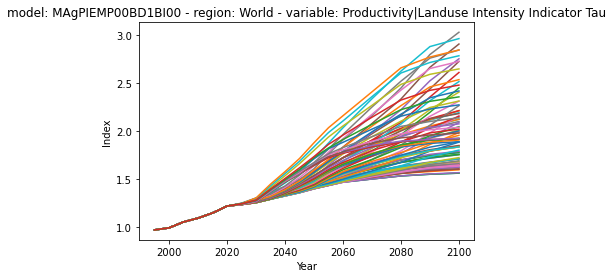

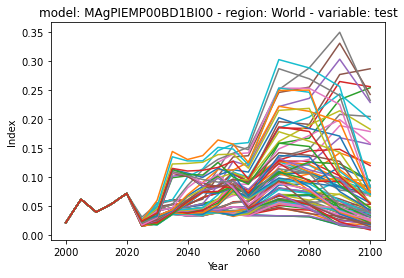

In [477]:
ghg1 = "100"
ghg2 = "4000"
bio1 = "45"
bio2 = "00"
scen = [f"SSP2BIO{bio1}GHG{ghg1}", f"SSP2BIO{bio2}GHG{ghg1}", f"SSP2BIO{bio1}GHG{ghg2}", f"SSP2BIO{bio2}GHG{ghg2}"]
print(scen)
print(scen)
py_df.filter(variable="Emissions|CO2|Land|+|Land-use Change", ).plot()
for i in df[df.index.get_level_values(3).str.startswith("Demand|Bioenergy|++|2nd generation")].index.get_level_values(3).unique():
    py_df.filter(variable=i, ).plot()
py_df.filter(variable="Emissions|CO2|Land|Land-use Change|Gross LUC|+|Deforestation", ).plot()
py_df.filter(variable="Emissions|CO2|Land|Land-use Change|Gross LUC|+|Other land conversion", ).plot()
for i in df[df.index.get_level_values(3).str.startswith("Resources|Land Cover|+")].index.get_level_values(3).unique()[:2]:
    py_df.filter(variable=i, ).plot()
py_df.filter(variable="Emissions|CO2|Land|Land-use Change|+|Regrowth", ).plot()
py_df.filter(variable="Productivity|Landuse Intensity Indicator Tau", ).plot()
py_df.filter(variable="Productivity|Landuse Intensity Indicator Tau", ).diff({"Productivity|Landuse Intensity Indicator Tau":"test"}).plot()

['SSP2BIO10GHG990', 'SSP2BIO10GHG100', 'SSP2BIO10GHG000']


<AxesSubplot:title={'center':'model: MAgPIEMP00BD1BI00 - region: World - variable: Emissions|CO2|Land|Land-use Change|+|Regrowth'}, xlabel='Year', ylabel='Mt CO2/yr'>

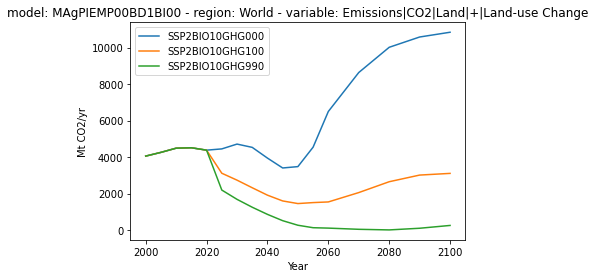

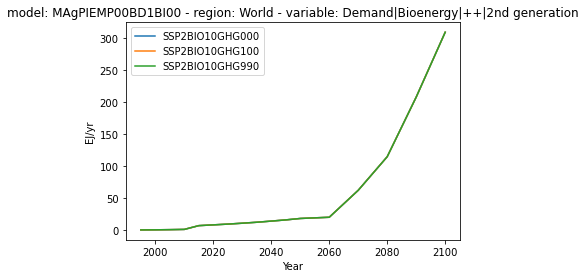

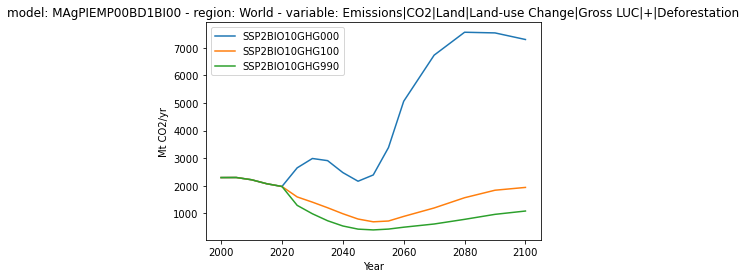

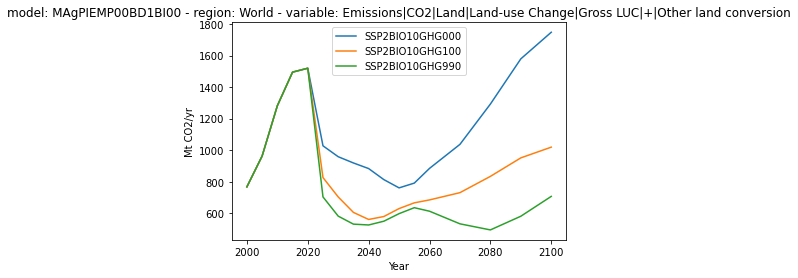

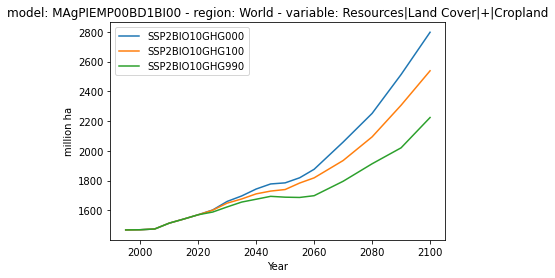

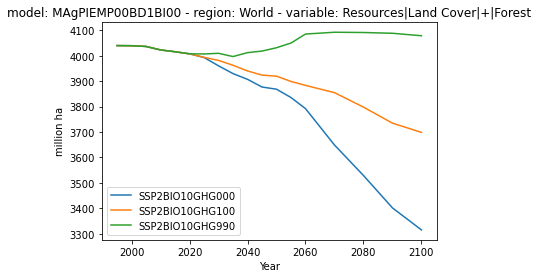

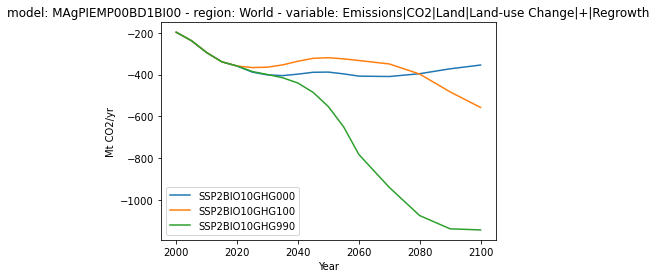

In [456]:
bio = "10"
scen = [f"SSP2BIO{bio}GHG990", f"SSP2BIO{bio}GHG100", f"SSP2BIO{bio}GHG000"]
print(scen)
py_df.filter(variable="Emissions|CO2|Land|+|Land-use Change", scenario=scen).plot()
for i in df[df.index.get_level_values(3).str.startswith("Demand|Bioenergy|++|2nd generation")].index.get_level_values(3).unique():
    py_df.filter(variable=i, scenario=scen).plot()
py_df.filter(variable="Emissions|CO2|Land|Land-use Change|Gross LUC|+|Deforestation", scenario=scen).plot()
py_df.filter(variable="Emissions|CO2|Land|Land-use Change|Gross LUC|+|Other land conversion", scenario=scen).plot()
for i in df[df.index.get_level_values(3).str.startswith("Resources|Land Cover|+")].index.get_level_values(3).unique()[:2]:
    py_df.filter(variable=i, scenario=scen).plot()
py_df.filter(variable="Emissions|CO2|Land|Land-use Change|+|Regrowth", scenario=scen).plot()

In [301]:
ax[0]

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>], dtype=object)

In [403]:
df[df.index.get_level_values(3).str.contains("Regrowth")]
#df[df.index.get_level_values(3).str.contains("LUC")]
df[df.index.get_level_values(3).str.startswith("Resources|Land Cover|For")].index.get_level_values(3).unique()
df[df.index.get_level_values(3).str.startswith("Demand|Bioenergy|++")].index.get_level_values(3).unique()

Index(['Demand|Bioenergy|++|1st generation',
       'Demand|Bioenergy|++|2nd generation',
       'Demand|Bioenergy|++|Overproduction',
       'Demand|Bioenergy|++|Traditional Burning'],
      dtype='object', name='Variable')

In [288]:
py_df.add("Emissions|CO2|Land|Land-use Change|+|Regrowth", luc_co2, "test", ignore_units=True, append=True)
py_df.add("test", "Emissions|CO2|Land|Land-use Change|+|Peatland", "test1", ignore_units=True).timeseries()              

2000  \
model             scenario        region variable unit                   
MAgPIEMP00BD1BI00 SSP2BIO05GHG400 World  test1    unknown  4052.726058   
                  SSP2BIO05GHG600 World  test1    unknown  4052.726058   
                  SSP2BIO07GHG400 World  test1    unknown  4052.726058   
                  SSP2BIO07GHG600 World  test1    unknown  4052.726058   
                  SSP2BIO10GHG400 World  test1    unknown  4052.726058   
                  SSP2BIO10GHG600 World  test1    unknown  4052.726058   

                                                                  2005  \
model             scenario        region variable unit                   
MAgPIEMP00BD1BI00 SSP2BIO05GHG400 World  test1    unknown  4256.643156   
                  SSP2BIO05GHG600 World  test1    unknown  4256.643156   
                  SSP2BIO07GHG400 World  test1    unknown  4256.643156   
                  SSP2BIO07GHG600 World  test1    unknown  4256.643156   
                  SSP2BIO10GHG400 World  test1    unknown  4256.643156   
                  SSP2BIO10GHG600 World  test1    unknown  4256.643156   

                                                                  2010  \
model             scenario        region variable unit                   
MAgPIEMP00BD1BI00 SSP2BIO05GHG400 World  test1    unknown  4486.586686   
                  SSP2BIO05GHG600 World  test1    unknown  4486.586686   
                  SSP2BIO07GHG400 World  test1    unknown  4486.586686   
                  SSP2BIO07GHG600 World  test1    unknown  4486.586686   
                  SSP2BIO10GHG400 World  test1    unknown  4486.586686   
                  SSP2BIO10GHG600 World  test1    unknown  4486.586686   

                                                                 2015  \
model             scenario        region variable unit                  
MAgPIEMP00BD1BI00 SSP2BIO05GHG400 World  test1    unknown  4509.69031   
                  SSP2BIO05GHG600 World  test1    unknown  4509.69031   
                  SSP2BIO07GHG400 World  test1    unknown  4509.69031   
                  SSP2BIO07GHG600 World  test1    unknown  4509.69031   
                  SSP2BIO10GHG400 World  test1    unknown  4509.69031   
                  SSP2BIO10GHG600 World  test1    unknown  4509.69031   

                                                                  2020  \
model             scenario        region variable unit                   
MAgPIEMP00BD1BI00 SSP2BIO05GHG400 World  test1    unknown  4377.733857   
                  SSP2BIO05GHG600 World  test1    unknown  4377.733857   
                  SSP2BIO07GHG400 World  test1    unknown  4377.733857   
                  SSP2BIO07GHG600 World  test1    unknown  4377.733857   
                  SSP2BIO10GHG400 World  test1    unknown  4377.733857   
                  SSP2BIO10GHG600 World  test1    unknown  4377.733857   

                                                                  2025  \
model             scenario        region variable unit                   
MAgPIEMP00BD1BI00 SSP2BIO05GHG400 World  test1    unknown  2461.082693   
                  SSP2BIO05GHG600 World  test1    unknown  2263.573047   
                  SSP2BIO07GHG400 World  test1    unknown  2461.082693   
                  SSP2BIO07GHG600 World  test1    unknown  2263.573047   
                  SSP2BIO10GHG400 World  test1    unknown  2461.082693   
                  SSP2BIO10GHG600 World  test1    unknown  2263.573047   

                                                                  2030  \
model             scenario        region variable unit                   
MAgPIEMP00BD1BI00 SSP2BIO05GHG400 World  test1    unknown  1977.076574   
                  SSP2BIO05GHG600 World  test1    unknown  1750.603598   
                  SSP2BIO07GHG400 World  test1    unknown  1977.092257   
                  SSP2BIO07GHG600 World  test1    unknown  1750.729300   
                  SSP2BIO10GHG400 World  test1    unknown  1976.100871  

In [273]:
py_df.filter(variable=afolu_co2).timeseries()

2000  \
model             scenario        region variable                             unit                     
MAgPIEMP00BD1BI00 SSP2BIO05GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4052.726058   
                  SSP2BIO05GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4052.726058   
                  SSP2BIO07GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4052.726058   
                  SSP2BIO07GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4052.726058   
                  SSP2BIO10GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4052.726058   
                  SSP2BIO10GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4052.726058   

                                                                                                2005  \
model             scenario        region variable                             unit                     
MAgPIEMP00BD1BI00 SSP2BIO05GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4256.643156   
                  SSP2BIO05GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4256.643156   
                  SSP2BIO07GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4256.643156   
                  SSP2BIO07GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4256.643156   
                  SSP2BIO10GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4256.643156   
                  SSP2BIO10GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4256.643156   

                                                                                                2010  \
model             scenario        region variable                             unit                     
MAgPIEMP00BD1BI00 SSP2BIO05GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4486.586686   
                  SSP2BIO05GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4486.586686   
                  SSP2BIO07GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4486.586686   
                  SSP2BIO07GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4486.586686   
                  SSP2BIO10GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4486.586686   
                  SSP2BIO10GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4486.586686   

                                                                                               2015  \
model             scenario        region variable                             unit                    
MAgPIEMP00BD1BI00 SSP2BIO05GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4509.69031   
                  SSP2BIO05GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4509.69031   
                  SSP2BIO07GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4509.69031   
                  SSP2BIO07GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4509.69031   
                  SSP2BIO10GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4509.69031   
                  SSP2BIO10GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4509.69031   

                                                                                                2020  \
model             scenario        region variable                             unit                     
MAgPIEMP00BD1BI00 SSP2BIO05GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4377.733857   
                  SSP2BIO05GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4377.733857   
                  SSP2BIO07GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4377.733857   
                  SSP2BIO07GHG600 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4377.733857   
                  SSP2BIO10GHG400 World  Emissions|CO2|Land|+|Land-use Change Mt CO2/yr  4377.733857   
                  SSP2BIO10GHG600 World  Emi